# FLUXNET-CH4  (no_spin_up)

## 1.Make the nml

### 1.1 Single Point nml

In [1]:
import itertools
import os
import subprocess
import glob, os, shutil, sys
import numpy as np
import pandas as pd
import xarray as xr
import time
from pathlib import Path

def get_timestamp_info_fast(station_list, path='/share/home/dq076/data/ME/FLUXNET-CH4/'):
    """快速提取CSV时间戳信息 - 使用行读取而非pandas"""
    site = f'FLX_{station_list["SITE_ID"]}_FLUXNET-CH4_{station_list["YEAR_START"]}-{station_list["YEAR_END"]}_1-1'
    hh_name = f'FLX_{station_list["SITE_ID"]}_FLUXNET-CH4_HH_{station_list["YEAR_START"]}-{station_list["YEAR_END"]}_1-1.csv'
    csv_path = f"{path}{site}/{hh_name}"
    
    # 直接用文件读取，避免pandas开销
    with open(csv_path, 'r') as f:
        header = f.readline().strip().split(',')
        first_line = f.readline().strip().split(',')
        
        # 找到TIMESTAMP列的索引
        try:
            ts_start_idx = header.index('TIMESTAMP_START')
            ts_end_idx = header.index('TIMESTAMP_END')
        except ValueError:
            raise ValueError(f"找不到TIMESTAMP列: {csv_path}")
        
        # 读取最后一行
        f.seek(0, 2)  # 移到文件末尾
        file_size = f.tell()
        f.seek(max(0, file_size - 1024))  # 往回读1KB（足够一行）
        lines = f.readlines()
        last_line = lines[-1].strip().split(',')
    
    # 确定使用哪个时间戳
    first_ts_start = first_line[ts_start_idx]
    if first_ts_start[:4] == str(station_list['YEAR_START']):
        start = first_ts_start
        end = last_line[ts_start_idx]
    else:
        start = first_line[ts_end_idx]
        end = last_line[ts_end_idx]
    
    return {
        'start_second': int(start[8:10]) * 3600 + int(start[10:12]) * 60,
        'end_second': int(end[8:10]) * 3600 + int(end[10:12]) * 60,
        'start_month': int(start[4:6]),
        'start_day': int(start[6:8]),
        'end_month': int(end[4:6]),
        'end_day': int(end[6:8])
    }

def create_namelist_fast(template_lines, station_info, case, nml_input):
    """使用字符串模板和单次遍历优化"""
    
    # 预构建替换字典（键为要查找的字符串片段）
    replacements = {
        "DEF_CASE_NAME = ": f"DEF_CASE_NAME = '{station_info['SITE_ID']}'\n",
        "DEF_simulation_time%start_year = ": f"DEF_simulation_time%start_year = {station_info['YEAR_START']}\n",
        "DEF_simulation_time%start_month = ": f"DEF_simulation_time%start_month = {station_info['start_month']}\n",
        "DEF_simulation_time%start_day = ": f"DEF_simulation_time%start_day = {station_info['start_day']}\n",
        "DEF_simulation_time%start_sec = ": f"DEF_simulation_time%start_sec = {station_info['start_second']}\n",
        "DEF_simulation_time%end_year = ": f"DEF_simulation_time%end_year = {station_info['YEAR_END']}\n",
        "DEF_simulation_time%end_month = ": f"DEF_simulation_time%end_month = {station_info['end_month']}\n",
        "DEF_simulation_time%end_day = ": f"DEF_simulation_time%end_day = {station_info['end_day']}\n",
        "DEF_simulation_time%end_sec = ": f"DEF_simulation_time%end_sec = {station_info['end_second']}\n",
        "DEF_simulation_time%spinup_year = ": f"DEF_simulation_time%spinup_year = {int(station_info['YEAR_START']) - 1}\n",
        "SITE_fsitedata = ": f"SITE_fsitedata = '{station_info['srfpath']}'\n",
        "DEF_dir_output = ": f"DEF_dir_output = '/share/home/dq076/data/cases/site/{case}/'\n",
        "DEF_wetland_finundation_scheme = ": f"DEF_wetland_finundation_scheme = 0\n",
        "DEF_Runoff_SCHEME = ": f"DEF_Runoff_SCHEME = 0\n",
        # "DEF_file_METHANE_para = ": f"DEF_file_METHANE_para = '{nml_input}site/{sample}/{sample}_ch4_parameter.nml'\n",
        "DEF_forcing_namelist = ": f"DEF_forcing_namelist = '{nml_input}/site/forcing/SINGLE_{station_info['SITE_ID']}.nml'\n"
    }
    
    # 单次遍历，使用startswith检查（比in更快）
    result = []
    for line in template_lines:
        replaced = False
        for key, value in replacements.items():
            if line.lstrip().startswith(key.split('=')[0].strip()):
                result.append(value)
                replaced = True
                break
        if not replaced:
            result.append(line)
    
    return result

if __name__ == '__main__':
    case = 'frcsat0'
    
    stnlist = f"/share/home/dq076/data/ME/FLUXNET-CH4/FLX_AA-Flx_CH4-META_20201112135337801132.csv"
    station_lists = pd.read_csv(stnlist, header=0)
    station_lists = station_lists[station_lists['FLUXNET-CH4_DATA_POLICY'] == 'CCBY4.0'].reset_index(drop=True)
    station_lists = station_lists[station_lists['SITE_ID'] != 'HK-MPM'].reset_index(drop=True)

    n = len(station_lists['SITE_ID'])
    nml_input = "/share/home/dq076/mode/ME/251202/run/"

    # 读取模板文件一次
    template_path = f"{nml_input}US-Los.nml"
    with open(template_path, 'r') as f:
        template_lines = f.readlines()

    # 添加srfpath
    station_lists['srfpath'] = station_lists.apply(
        lambda row: f'/share/home/dq076/data/CoLM_Forcing/PLUMBER2/Srfdata/{row["SITE_ID"]}_{row["YEAR_START"]}-{row["YEAR_END"]}_FLUXNET-CH4_Srf.nc',
        axis=1
    )

    n = len(station_lists)
    print(f"处理 {n} 个站点")
    
    nml_output_base = f"{nml_input}site/{case}/"
    Path(nml_output_base).mkdir(parents=True, exist_ok=True)

    # 处理每个站点
    total_count = 0
    for idx in range(n):
        station_dict = station_lists.iloc[idx].to_dict()
        
        # 获取时间戳信息（每个站点一次）
        try:
            timestamp_info = get_timestamp_info_fast(station_dict)
        except Exception as e:
            print(f"错误: 站点 {station_dict['SITE_ID']} 读取CSV失败: {e}")
            continue
        
        # 合并站点信息和时间戳信息
        station_info = {**station_dict, **timestamp_info}
        
        output_path = f"{nml_output_base}{station_dict['SITE_ID']}.nml"
        
        # 生成内容
        content = create_namelist_fast(template_lines, station_info, case, nml_input)
        
        # 写入文件
        with open(output_path, 'w') as f:
            f.writelines(content)
        
        total_count += 1
        
        # 显示进度
        if (idx + 1) % 5 == 0 or (idx + 1) == n:
            print(f"进度: {idx + 1}/{n} 个站点完成 ({total_count} 个文件)")
    
    print(f"\n完成! 总共生成 {total_count} 个namelist文件")

处理 78 个站点
进度: 5/78 个站点完成 (5 个文件)
进度: 10/78 个站点完成 (10 个文件)
进度: 15/78 个站点完成 (15 个文件)
进度: 20/78 个站点完成 (20 个文件)
进度: 25/78 个站点完成 (25 个文件)
进度: 30/78 个站点完成 (30 个文件)
进度: 35/78 个站点完成 (35 个文件)
进度: 40/78 个站点完成 (40 个文件)
进度: 45/78 个站点完成 (45 个文件)
进度: 50/78 个站点完成 (50 个文件)
进度: 55/78 个站点完成 (55 个文件)
进度: 60/78 个站点完成 (60 个文件)
进度: 65/78 个站点完成 (65 个文件)
进度: 70/78 个站点完成 (70 个文件)
进度: 75/78 个站点完成 (75 个文件)
进度: 78/78 个站点完成 (78 个文件)

完成! 总共生成 78 个namelist文件


### 1.2 Forcing nml

In [2]:
import os
import pandas as pd

def make_namelist(station_list):
    nml_file_path = "/share/home/dq076/mode/ME/251202/run/forcing/"  # model nml file
    
    # 读取模板
    with open(nml_file_path + 'SINGLE.nml', 'r') as f:
        template_lines = f.readlines()

    # ---------- 构建替换字典 ----------
    # 注意：这里 key 是文件中的开头字符串（不包含值）
    replacements = {
        "DEF_forcing%startyr =": f"DEF_forcing%startyr = {station_list['YEAR_START']}\n",
        "DEF_forcing%endyr =":   f"DEF_forcing%endyr = {station_list['YEAR_END']}\n",
    }

    # fprefix(1..8)
    for j in range(8):
        key = f"DEF_forcing%fprefix({j+1}) ="
        replacements[key] = f"DEF_forcing%fprefix({j+1}) = '{station_list['forcing_name']}'\n"

    # ---------- 单次遍历模板并替换 ----------
    result = []
    for line in template_lines:
        stripped = line.lstrip()  # 去掉前导空格以匹配开头

        replaced = False
        for key, value in replacements.items():
            # 用 startswith 而不是 in，提高效率且行为更确定
            if stripped.startswith(key):
                result.append(value)
                replaced = True
                break

        if not replaced:
            result.append(line)

    # ---------- 写出文件 ----------
    outdir = f"{nml_file_path}../site/forcing/"
    os.makedirs(outdir, exist_ok=True)

    outfile = f"{outdir}SINGLE_{station_list['SITE_ID']}.nml"
    with open(outfile, 'w') as f:
        f.writelines(result)



# ======================================================
# 主程序
# ======================================================
if __name__ == '__main__':

    stnlist = "/share/home/dq076/data/ME/FLUXNET-CH4/FLX_AA-Flx_CH4-META_20201112135337801132.csv"
    station_lists = pd.read_csv(stnlist, header=0)
    station_lists = station_lists[station_lists['FLUXNET-CH4_DATA_POLICY'] == 'CCBY4.0'].reset_index(drop=True)
    station_lists = station_lists[station_lists['SITE_ID'] != 'HK-MPM'].reset_index(drop=True)

    n = len(station_lists)
    total_count = 0

    for i in range(n):
        station_list = station_lists.iloc[i].copy()
        station_list['forcing_name'] = (
            f"{station_list['SITE_ID']}_"
            f"{station_list['YEAR_START']}-{station_list['YEAR_END']}_"
            f"FLUXNET-CH4_Met.nc"
        )

        make_namelist(station_list)

        total_count += 1

        if (i + 1) % 5 == 0 or (i + 1) == n:
            print(f"进度: {i + 1}/{n} 个站点完成 ({total_count} 个文件)")


进度: 5/78 个站点完成 (5 个文件)
进度: 10/78 个站点完成 (10 个文件)
进度: 15/78 个站点完成 (15 个文件)
进度: 20/78 个站点完成 (20 个文件)
进度: 25/78 个站点完成 (25 个文件)
进度: 30/78 个站点完成 (30 个文件)
进度: 35/78 个站点完成 (35 个文件)
进度: 40/78 个站点完成 (40 个文件)
进度: 45/78 个站点完成 (45 个文件)
进度: 50/78 个站点完成 (50 个文件)
进度: 55/78 个站点完成 (55 个文件)
进度: 60/78 个站点完成 (60 个文件)
进度: 65/78 个站点完成 (65 个文件)
进度: 70/78 个站点完成 (70 个文件)
进度: 75/78 个站点完成 (75 个文件)
进度: 78/78 个站点完成 (78 个文件)


## 2.Run the CoLM

In [3]:
import subprocess
import os
from joblib import Parallel, delayed
import glob
from concurrent.futures import ProcessPoolExecutor, as_completed  # 切换到 ProcessPoolExecutor 以支持实时进度

def load_environment(env_file):
    cmd = f'bash -c "source {env_file} && env"'
    result = subprocess.run(cmd, shell=True, capture_output=True, text=True)
    
    new_env = {}
    for line in result.stdout.strip().split('\n'):
        if '=' in line:
            key, value = line.split('=', 1)
            if not key.startswith('BASH_FUNC_'):
                new_env[key] = value
    
    os.environ.update(new_env)
    return os.environ.copy()

def run_colm(run_path, nml_path, log_path, nml_name, updated_env):
    """
    处理单个 nml 文件，返回成功/失败状态（不打印进度，由主脚本处理）。
    """
    nml_file = f'{nml_path}{nml_name}.nml'
    log_file = f'{log_path}{nml_name}.txt'
    
    try:
        # 用 'w' 模式打开文件，重置内容
        with open(log_file, 'w', encoding='utf-8') as log:
            log.write(f"=== 处理 {nml_name}.nml ===\n")
            log.flush()
            
            commands = [
                [f'{run_path}mksrfdata.x', nml_file],
                [f'{run_path}mkinidata.x', nml_file],
                [f'{run_path}colm.x', nml_file]
            ]
            
            for cmd in commands:
                log.write(f"执行命令: {' '.join(cmd)}\n")
                log.flush()
                
                result = subprocess.run(
                    cmd, 
                    env=updated_env, 
                    stdout=log, 
                    stderr=subprocess.STDOUT, 
                    text=True
                )

                if result.returncode != 0:
                    log.write(f"\n命令失败，返回码: {result.returncode}\n")
                    return False
                
                log.write("\n" + "="*50 + "\n")
                log.flush()

            log.write(f"=== {nml_name} 处理完成 ===\n")
            log.flush()
        
        return True  # 成功
    
    except Exception as e:
        # 如果失败，也记录到日志
        with open(log_file, 'w', encoding='utf-8') as log:
            log.write(f"=== {nml_name}.nml 处理失败: {str(e)} ===\n")
        return False

if __name__ == "__main__":
    case = 'frcsat0'
    print(f"=" * 60)
    print(f"节点: {os.environ.get('HOSTNAME', 'unknown')}")
    print(f"可用核心: {os.cpu_count()}")
    print(f"=" * 60)
    
    # 配置路径
    env_file = '/share/home/dq089/soft/gnu-env'
    run_path = '/share/home/dq076/mode/ME/251202/run/'
    nml_path = f'{run_path}site/{case}/'
    log_path = f'{nml_path}logs/'
    
    os.makedirs(log_path, exist_ok=True)
    
    # 加载环境
    print("加载环境变量...")
    updated_env = load_environment(env_file)
    
    # 获取所有nml文件
    nml_files = glob.glob(f'{nml_path}*.nml')
    nml_names = [
        os.path.splitext(os.path.basename(nml_file))[0] 
        for nml_file in nml_files 
        if 'HK-MPM' not in nml_file
    ]
    
    print(f"发现 {len(nml_names)} 个站点")
    print(f"站点列表: {nml_names[:5]}{'...' if len(nml_names) > 5 else ''}")
    
    # 并行处理所有站点
    max_workers = min(36, len(nml_names))
    print(f"使用 {max_workers} 个并行进程")
    print("=" * 60)
    
    with ProcessPoolExecutor(max_workers=max_workers) as executor:
        future_to_nml = {
            executor.submit(run_colm, run_path, nml_path, log_path, nml_name, updated_env): nml_name
            for nml_name in nml_names
        }
        completed_count = 0
        remaining_nml = set(nml_names)

        required_markers = [
            "Successful in surface data making.",
            "CoLM Initialization Execution Completed",
            "CoLM Execution Completed."
        ]
        success_list = []
        fail_list = []

        for future in as_completed(future_to_nml):
            nml_name = future_to_nml[future]

            # Step 1: Wait for job to finish
            try:
                future.result()
                print(f"=== {nml_name}: 已完成执行阶段 ===")
            except Exception as exc:
                print(f"✗ {nml_name}: 执行阶段异常 - {exc}")
                continue
            completed_count += 1
            remaining_nml.discard(nml_name)  # 移除已完成（无论成功/失败）

            # Step 2: Immediately scan log file
            log_file = f"{log_path}{nml_name}.txt"

            if not os.path.exists(log_file):
                fail_list.append(nml_name)
                print(f"✗ {nml_name}：日志文件不存在（视为失败）")
                continue

            try:
                with open(log_file, "r", encoding="utf-8", errors="ignore") as f:
                    content = f.read()

                if all(marker in content for marker in required_markers):
                    success_list.append(nml_name)
                    print(f"✓ {nml_name}: 运行成功 ✓")
                else:
                    fail_list.append(nml_name)
                    print(f"✗ {nml_name}: 日志检查失败（缺少关键标识）")
            except Exception as exc:
                fail_list.append(nml_name)
                print(f"✗ {nml_name}: 日志检查异常 - {exc}")

            print(f"已完成总数: {completed_count}/{len(nml_names)}")
            if remaining_nml:
                print(f"剩余未处理: {sorted(list(remaining_nml))}")
            else:
                print("所有任务已完成！")
            print("-" * 60)

    # ----------------------------------------------------------
    # 打印总结
    # ----------------------------------------------------------
    print("=" * 60)
    print(f"成功: {len(success_list)} / {len(nml_names)}")
    print(f"失败: {len(fail_list)} / {len(nml_names)}\n")
    
    if fail_list:
        print("失败站点：")
        for name in fail_list:
            print("  -", name)
    else:
        print("所有站点均完成！")

    print("=" * 60)
                


节点: node112
可用核心: 48
加载环境变量...
发现 78 个站点
站点列表: ['US-Tw1', 'US-Tw4', 'US-Uaf', 'ID-Pag', 'US-MRM']...
使用 36 个并行进程
=== US-EDN: 已完成执行阶段 ===
✓ US-EDN: 运行成功 ✓
已完成总数: 1/78
剩余未处理: ['AT-Neu', 'BR-Npw', 'BW-Gum', 'BW-Nxr', 'CA-SCB', 'CA-SCC', 'CH-Cha', 'CH-Dav', 'CH-Oe2', 'CN-Hgu', 'DE-Dgw', 'DE-Hte', 'DE-SfN', 'DE-Zrk', 'FI-Hyy', 'FI-Lom', 'FI-Si2', 'FI-Sii', 'FR-LGt', 'ID-Pag', 'IT-BCi', 'IT-Cas', 'JP-BBY', 'JP-Mse', 'JP-SwL', 'KR-CRK', 'MY-MLM', 'NL-Hor', 'NZ-Kop', 'PH-RiF', 'RU-Ch2', 'RU-Che', 'RU-Cok', 'RU-Fy2', 'SE-Deg', 'UK-LBT', 'US-A03', 'US-A10', 'US-Atq', 'US-BZB', 'US-BZF', 'US-BZS', 'US-Beo', 'US-Bes', 'US-Bi1', 'US-Bi2', 'US-CRT', 'US-DPW', 'US-EML', 'US-HRA', 'US-HRC', 'US-Ho1', 'US-ICs', 'US-Ivo', 'US-LA1', 'US-LA2', 'US-Los', 'US-MAC', 'US-MRM', 'US-Myb', 'US-NC4', 'US-NGB', 'US-NGC', 'US-ORv', 'US-OWC', 'US-Pfa', 'US-Snd', 'US-Sne', 'US-Srr', 'US-StJ', 'US-Tw1', 'US-Tw3', 'US-Tw4', 'US-Tw5', 'US-Twt', 'US-Uaf', 'US-WPT']
--------------------------------------------------------

## 3.Postprocess

In [4]:
import os
import glob
import pandas as pd
import multiprocessing as mp


def process_station(args):
    i, station_lists, data_path = args
    
    station = station_lists.iloc[i]
    case = station['SITE_ID']
    yrstt = int(station['YEAR_START'])
    yrend = int(station['YEAR_END'])

    history_path = f'{data_path}/{case}/history/'
    postdata_path = f'{data_path}/{case}/postdata/'
    output_name = f'{case}_hist_{yrstt}-{yrend}.nc'

    os.makedirs(postdata_path, exist_ok=True)

    # get history nc files
    nc_files = sorted([f for f in os.listdir(history_path) if f.endswith('.nc')])

    if not nc_files:
        print(f"[SKIP] No NC files for {case}")
        return

    # If only 1 year, directly copy
    if yrstt == yrend:
        src = f"{history_path}{case}_hist_{yrstt}.nc"
        dst = f"{postdata_path}{output_name}"
        os.system(f"cp {src} {dst}")
        print(f"[DONE] {case}: copied single-year file")
    else:
        # Multiple years → merge
        os.system(f"cdo -O -mergetime {history_path}*.nc {postdata_path}{output_name}")
        print(f"[DONE] {case}: merged {yrstt}-{yrend}")



if __name__ == "__main__":

    case = 'frcsat0'
    cases_path = '/share/home/dq076/data/cases/site/'
    data_path = f'{cases_path}/{case}/'

    # Load site list
    stnlist = "/share/home/dq076/data/ME/FLUXNET-CH4/FLX_AA-Flx_CH4-META_20201112135337801132.csv"
    station_lists = pd.read_csv(stnlist)

    # Filter
    station_lists = station_lists[station_lists['FLUXNET-CH4_DATA_POLICY'] == 'CCBY4.0']
    station_lists = station_lists[station_lists['SITE_ID'] != 'HK-MPM']
    station_lists = station_lists.reset_index(drop=True)

    nstations = station_lists.shape[0]
    print(f"Found {nstations} sites")

    args_list = [(i, station_lists, data_path) for i in range(nstations)]

    # Use multiprocessing
    with mp.Pool(processes=mp.cpu_count()) as pool:
        pool.map(process_station, args_list)

    print("=== All sites processed ===")


Found 78 sites
[DONE] FI-Hyy: copied single-year file[DONE] BW-Nxr: copied single-year file[DONE] CH-Oe2: copied single-year file[DONE] BW-Gum: copied single-year file



[DONE] JP-SwL: copied single-year file
[DONE] JP-Mse: copied single-year file
[DONE] US-HRA: copied single-year file
[DONE] US-EDN: copied single-year file
[DONE] US-HRC: copied single-year file
[DONE] ID-Pag: merged 2016-2017
[DONE] US-Bi2: merged 2017-2018
[DONE] US-CRT: merged 2011-2012
[DONE] US-BZS: merged 2015-2016
[DONE] CH-Dav: merged 2016-2017
[DONE] US-LA2: merged 2011-2013
[DONE] MY-MLM: merged 2014-2015
[DONE] IT-Cas: merged 2009-2010
[DONE] US-Beo: merged 2013-2014
[DONE] IT-BCi: merged 2017-2018
[DONE] FR-LGt: merged 2017-2018
[DONE] US-LA1: merged 2011-2012
[DONE] CN-Hgu: merged 2015-2017
[DONE] US-BZF: merged 2014-2016
[DONE] DE-SfN: merged 2012-2014
[DONE] US-StJ: copied single-year file
[DONE] RU-Ch2: merged 2014-2016
[DONE] US-MRM: merged 2012-2013
[DONE] US-MAC: merged 2013-2015
[DONE] US-Tw5: copi

## 4.Draw the plot

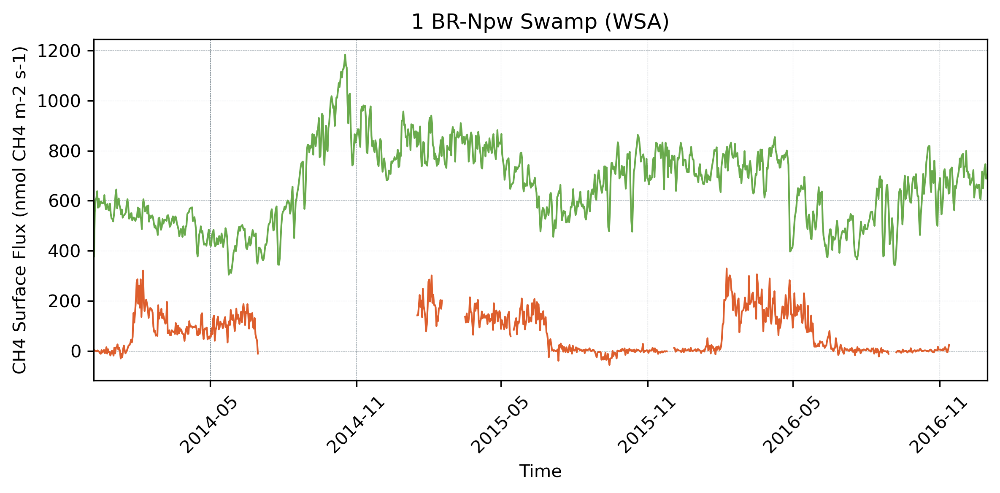

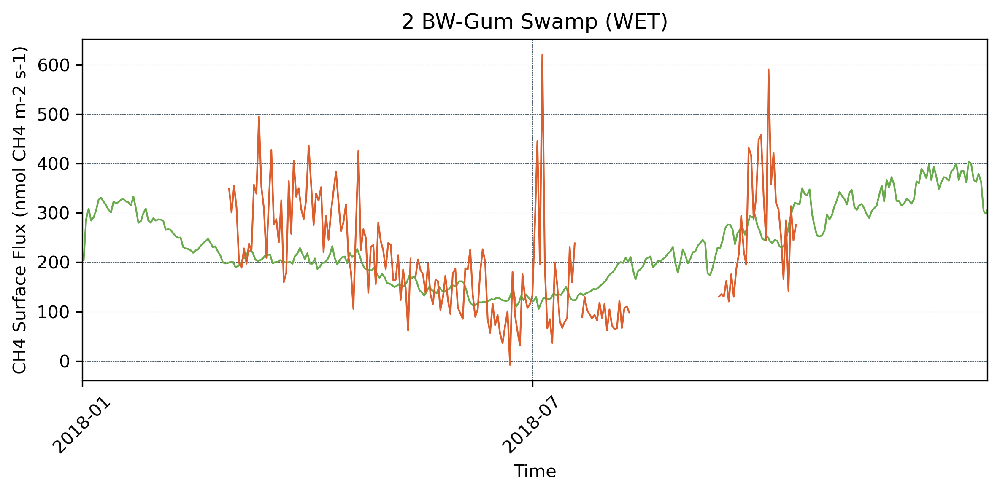

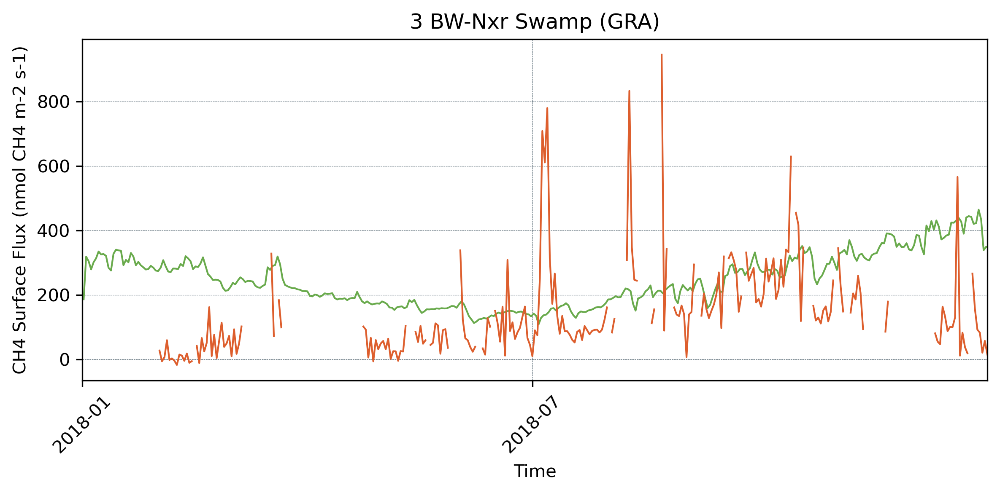

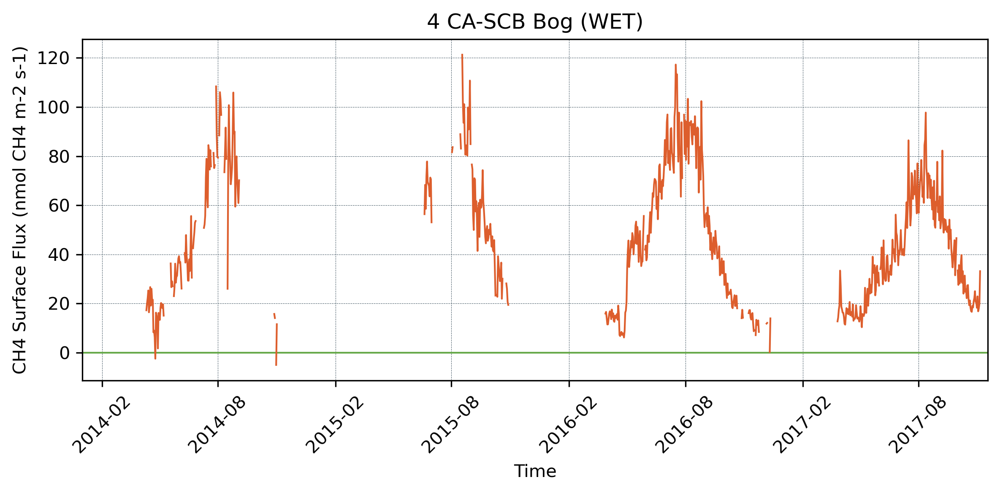

/tmp/ipykernel_559756/4101195460.py:104: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


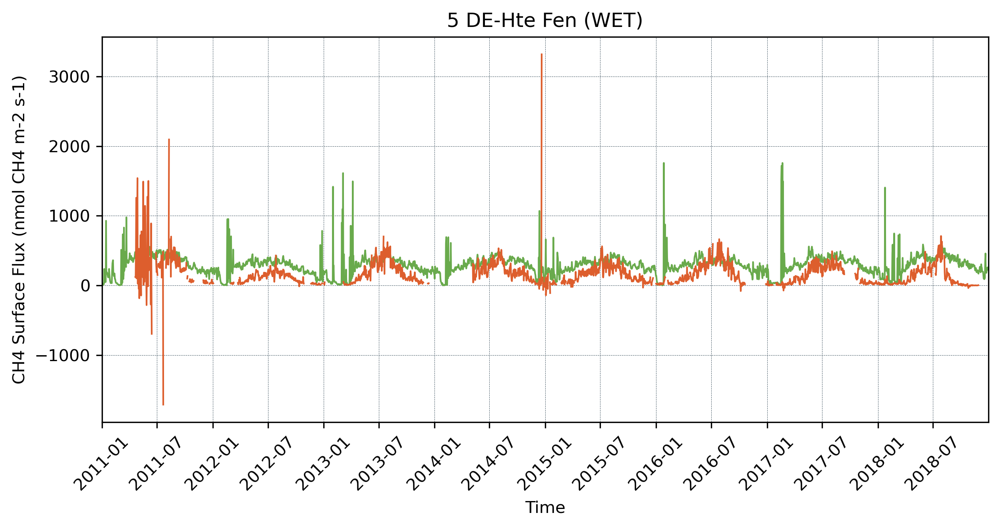

/tmp/ipykernel_559756/4101195460.py:104: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


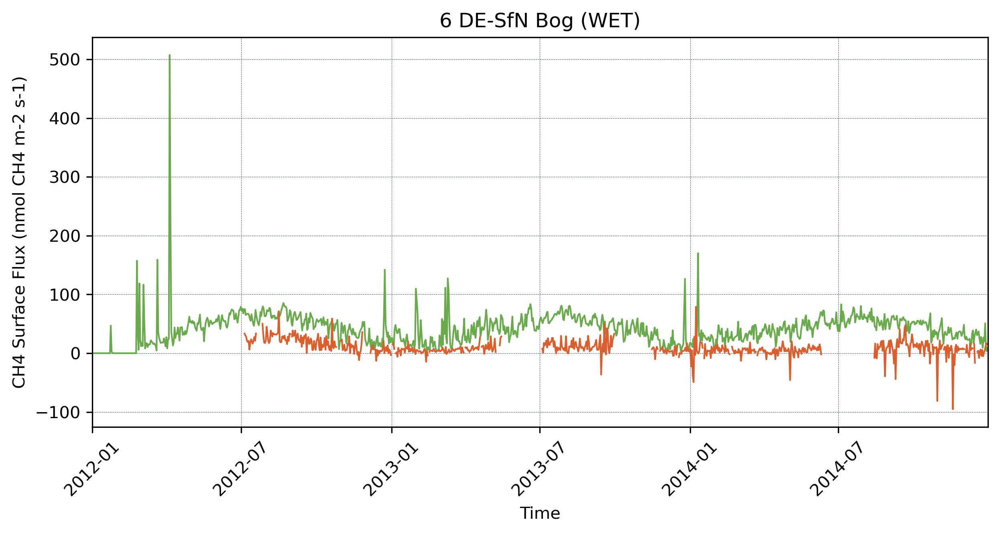

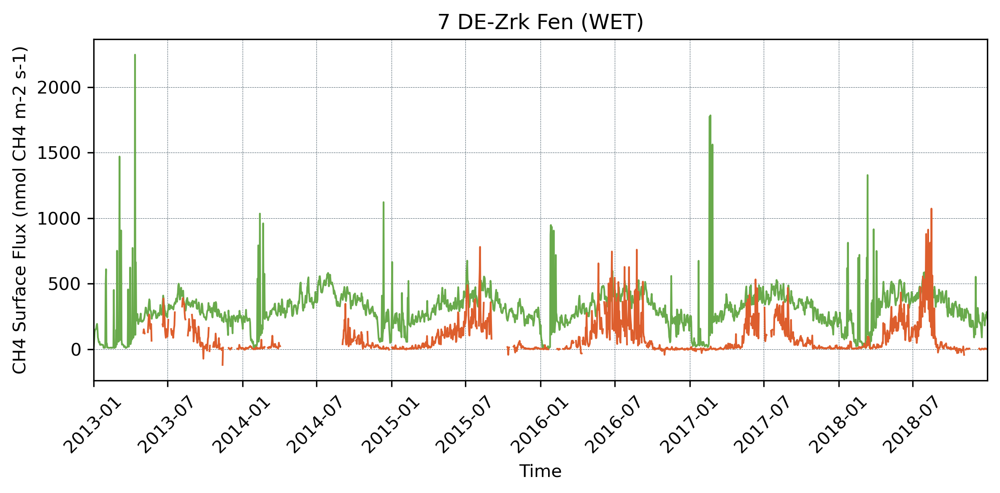

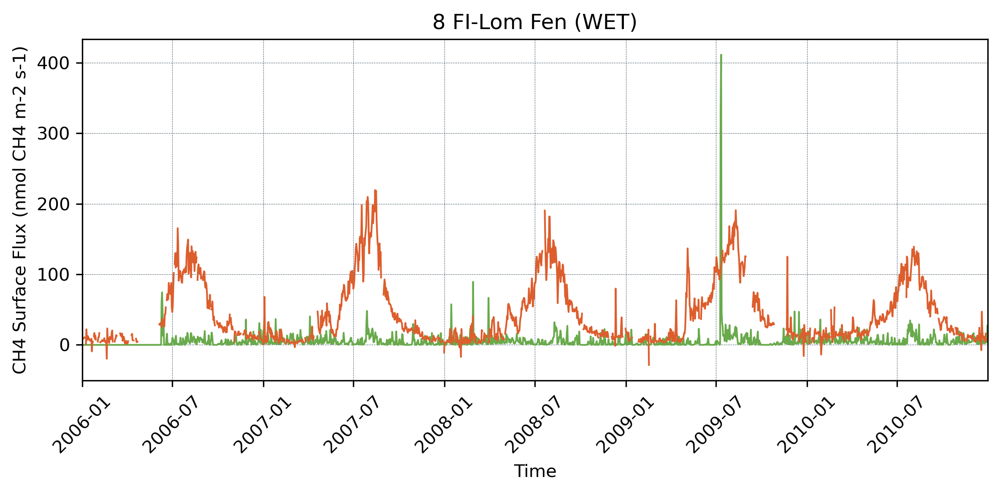

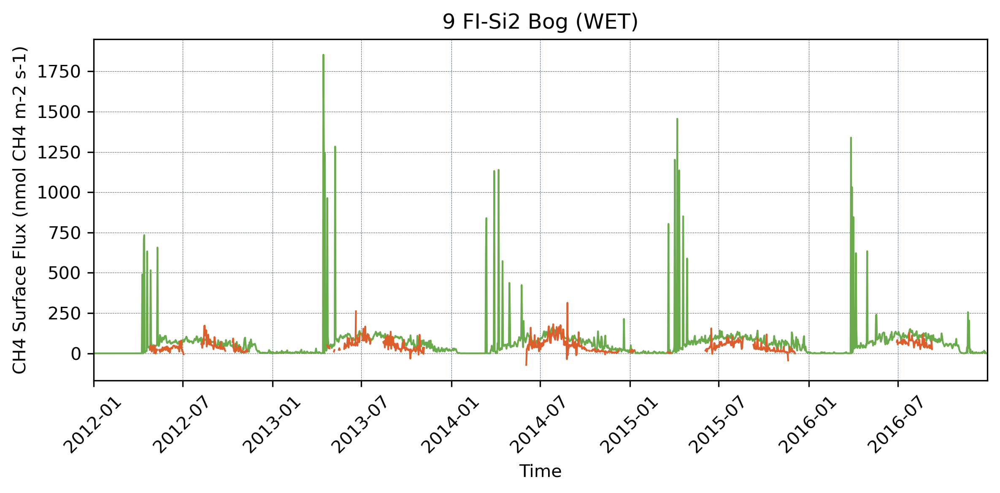

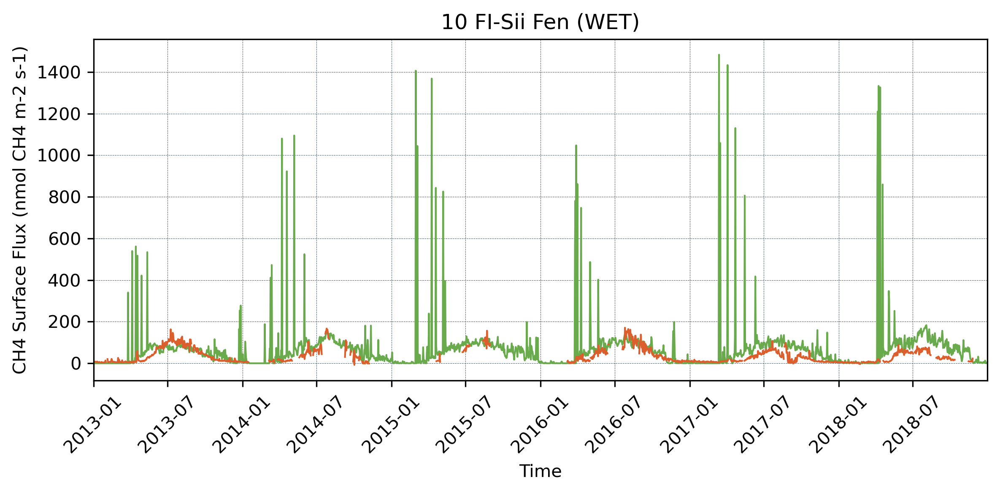

...

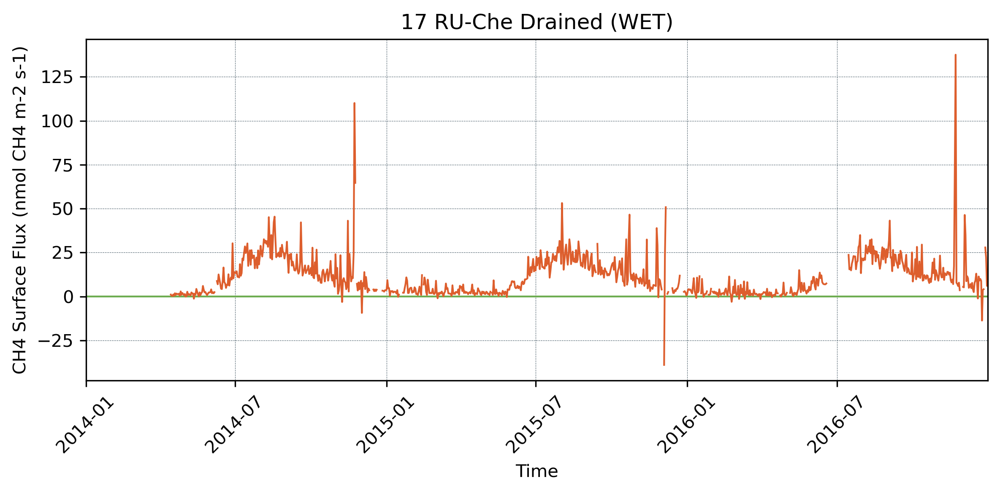

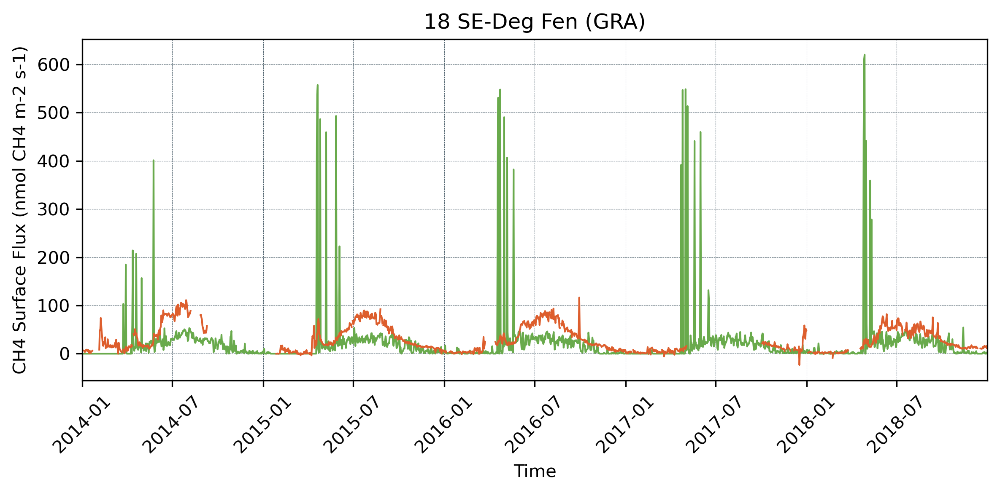

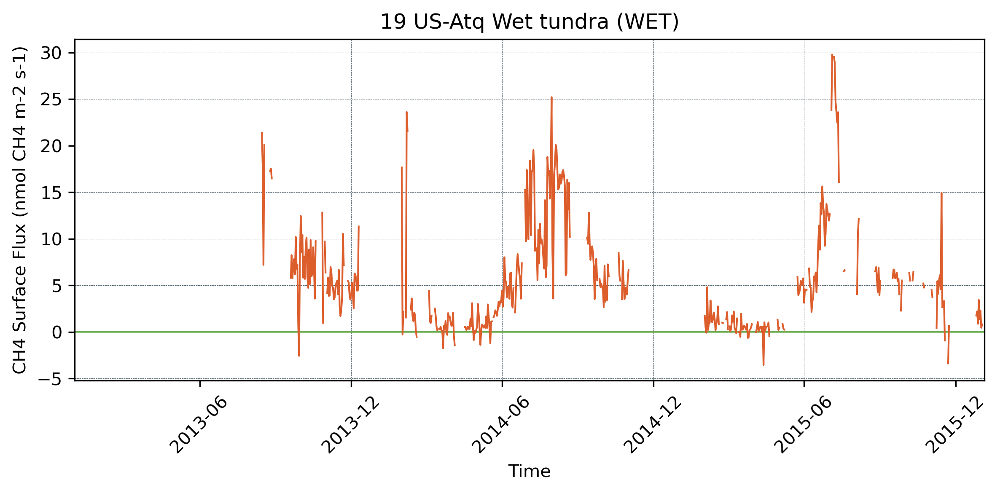

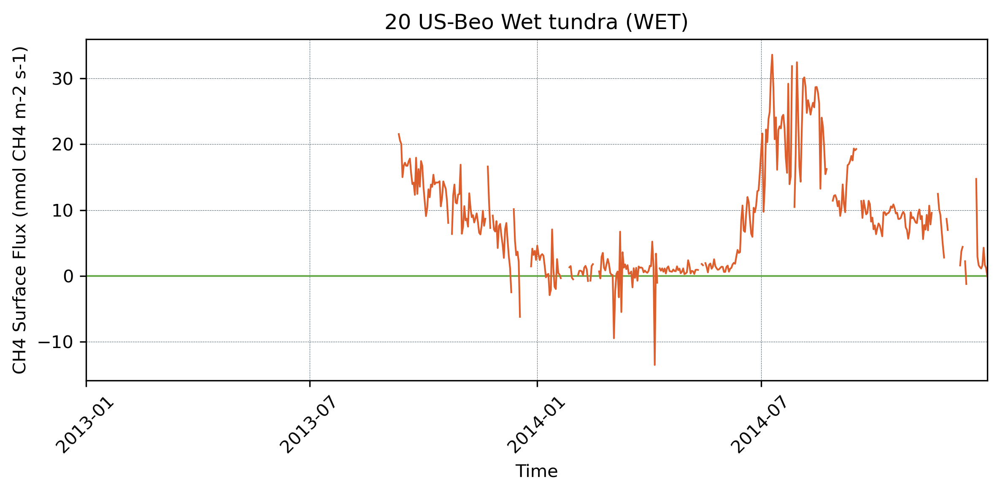

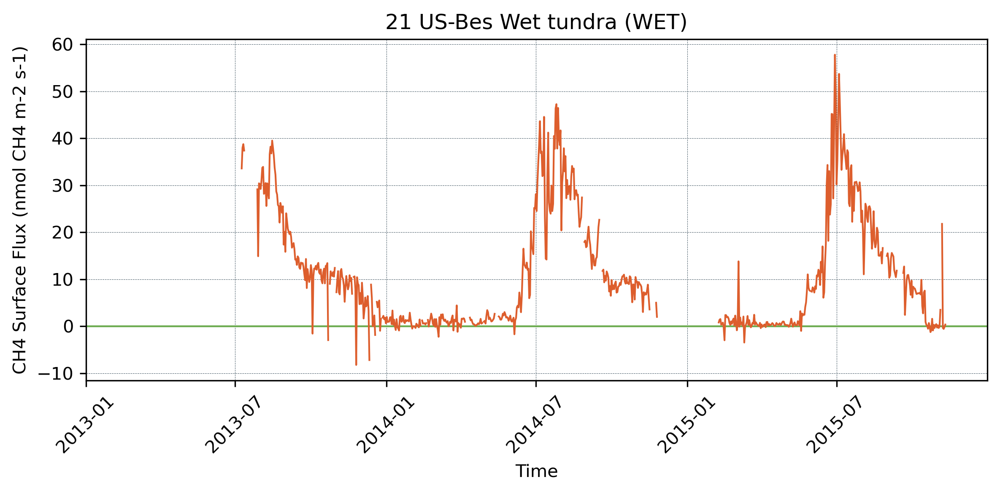

/tmp/ipykernel_559756/4101195460.py:104: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


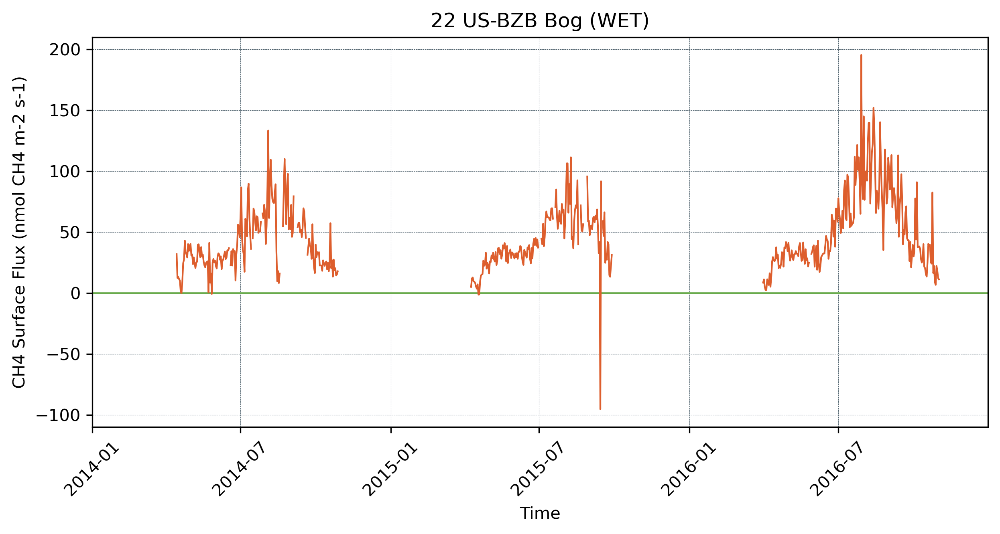

/tmp/ipykernel_559756/4101195460.py:104: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


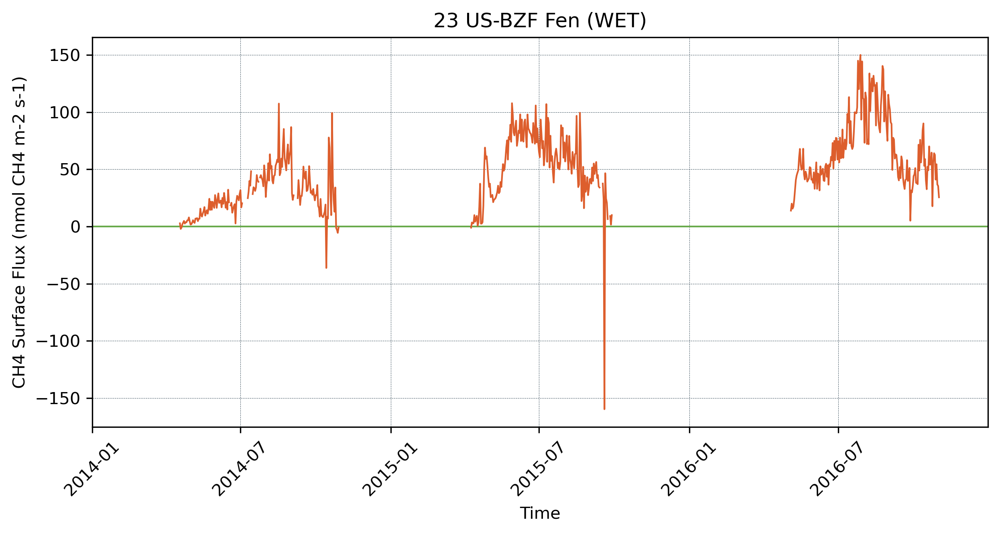

/tmp/ipykernel_559756/4101195460.py:104: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


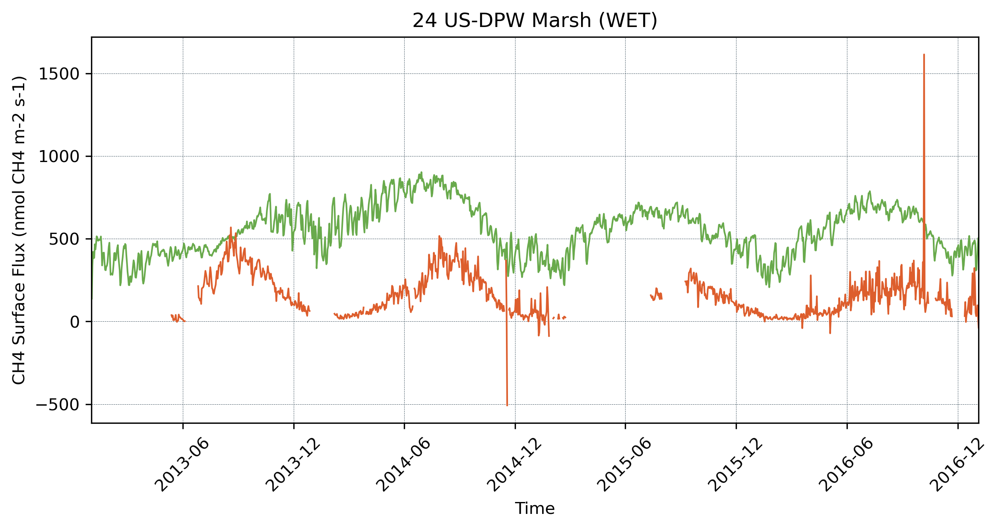

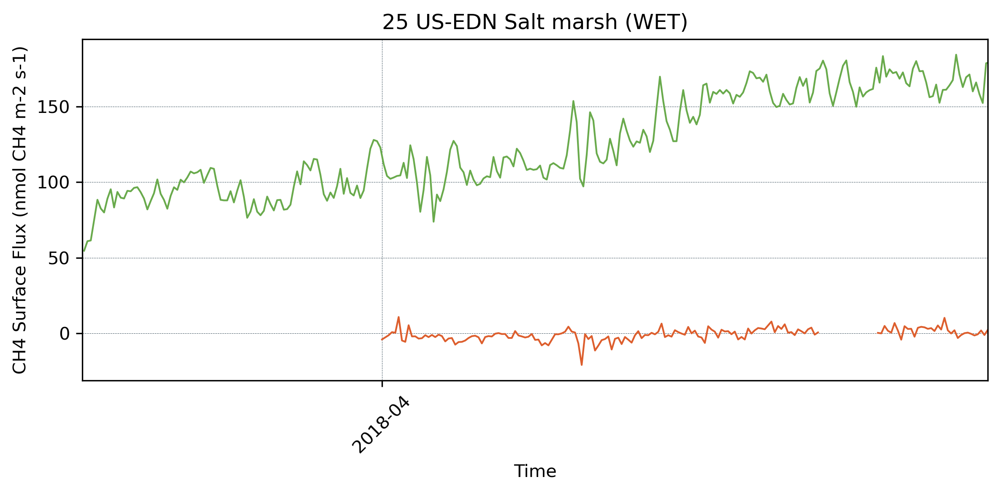

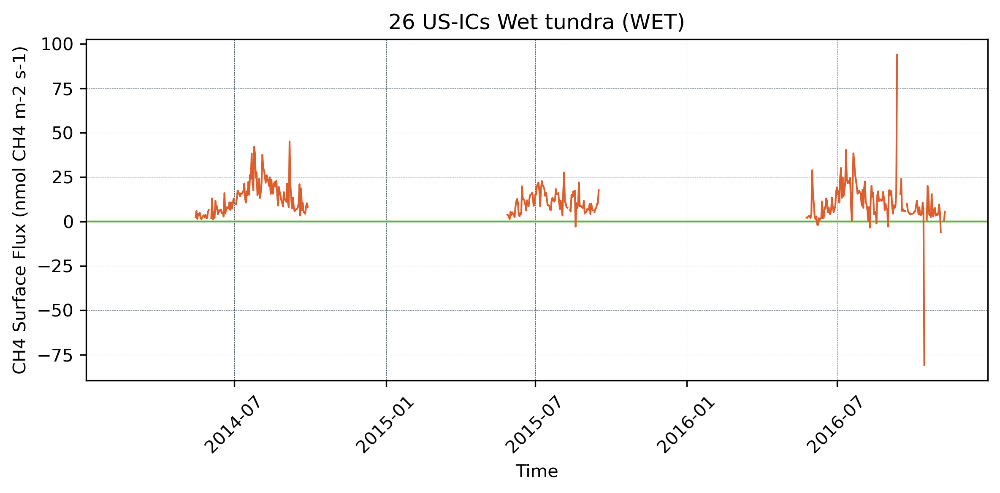

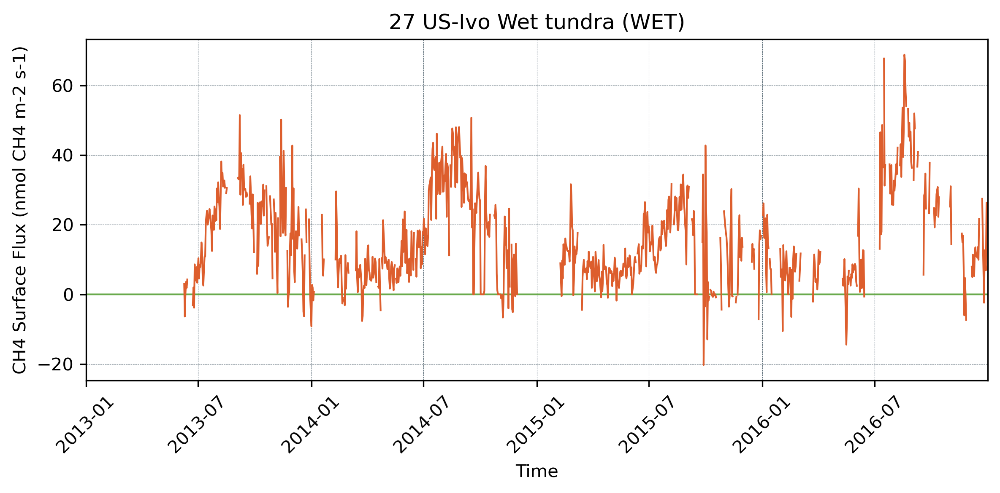

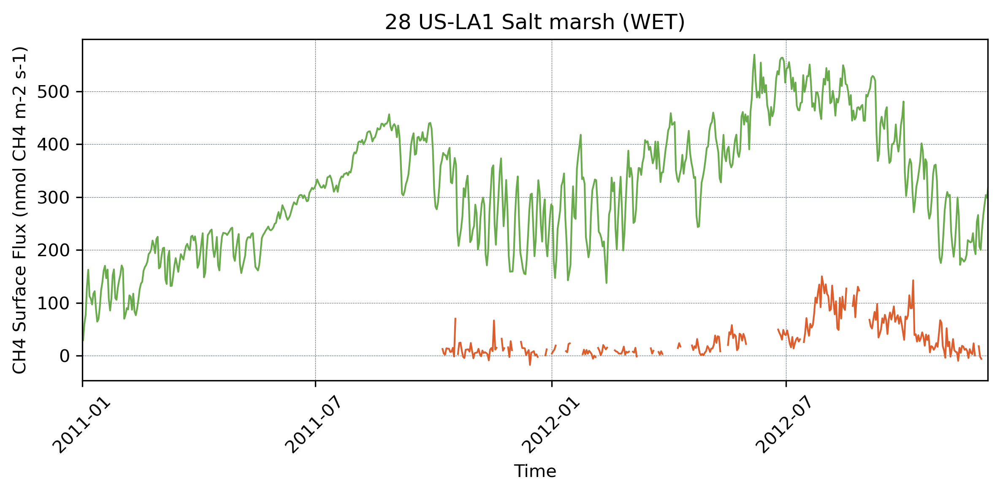

/tmp/ipykernel_559756/4101195460.py:104: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


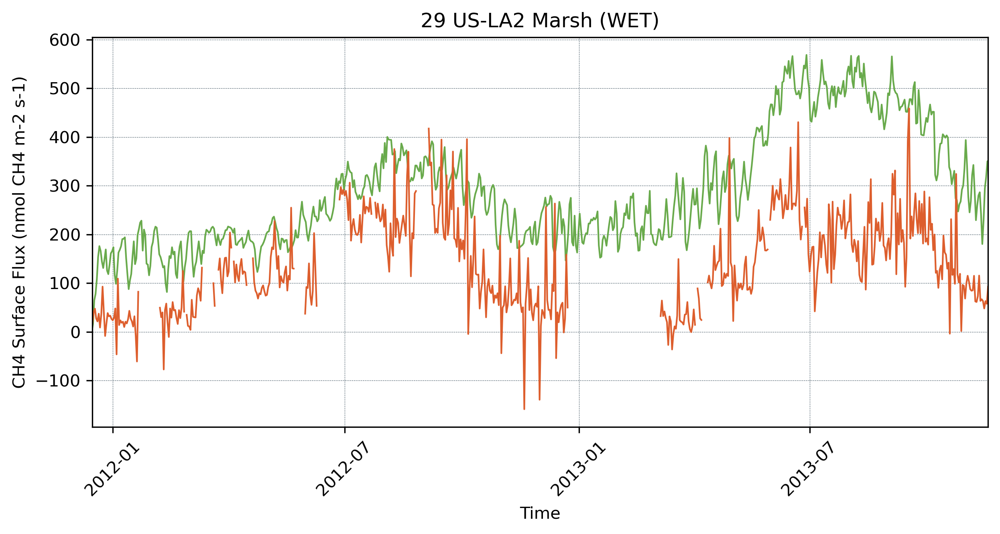

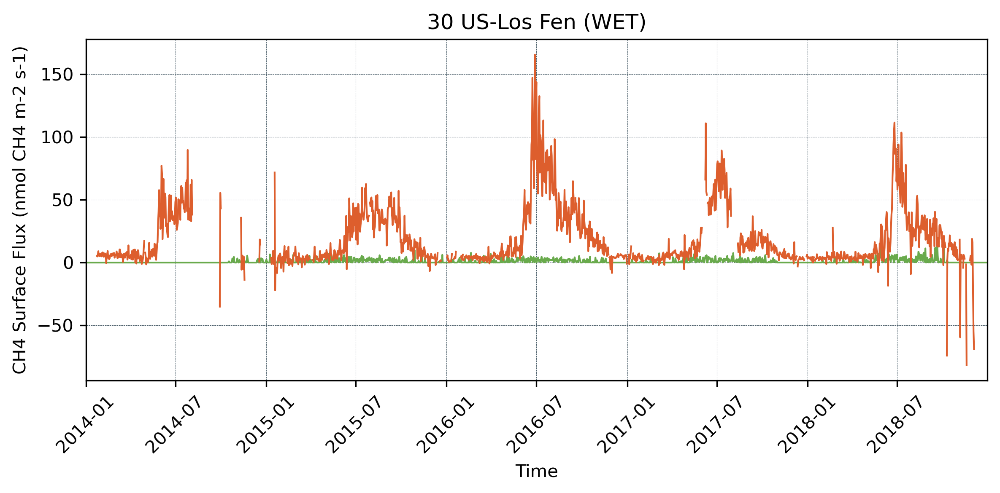

/tmp/ipykernel_559756/4101195460.py:104: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


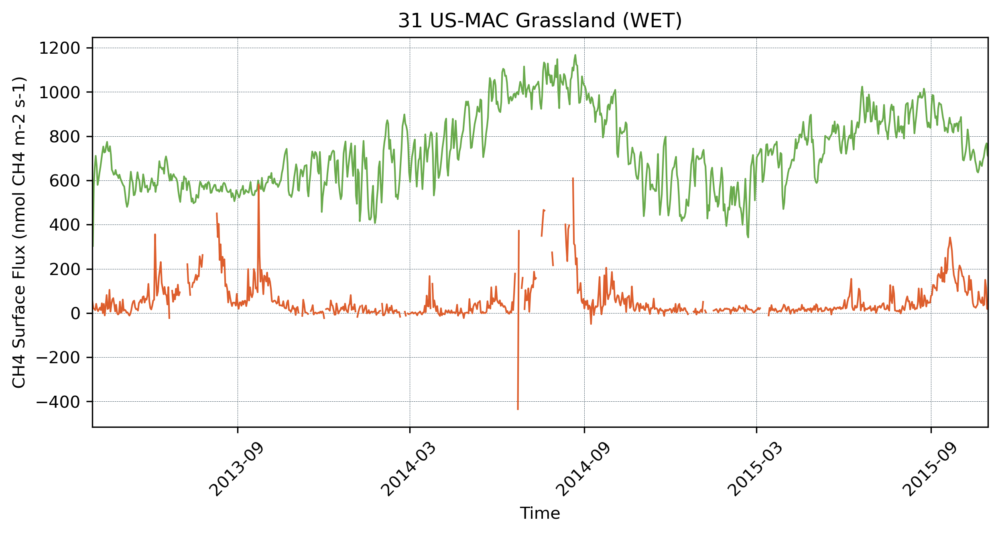

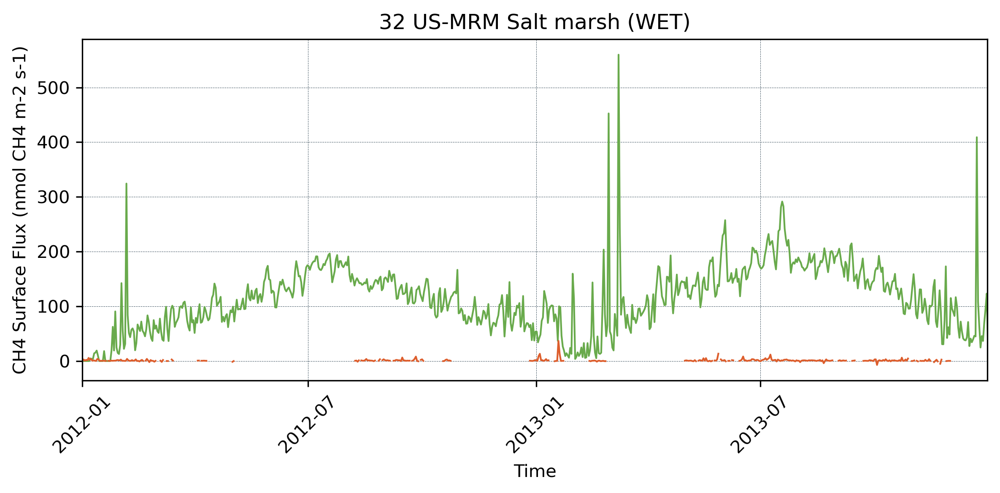

/tmp/ipykernel_559756/4101195460.py:104: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


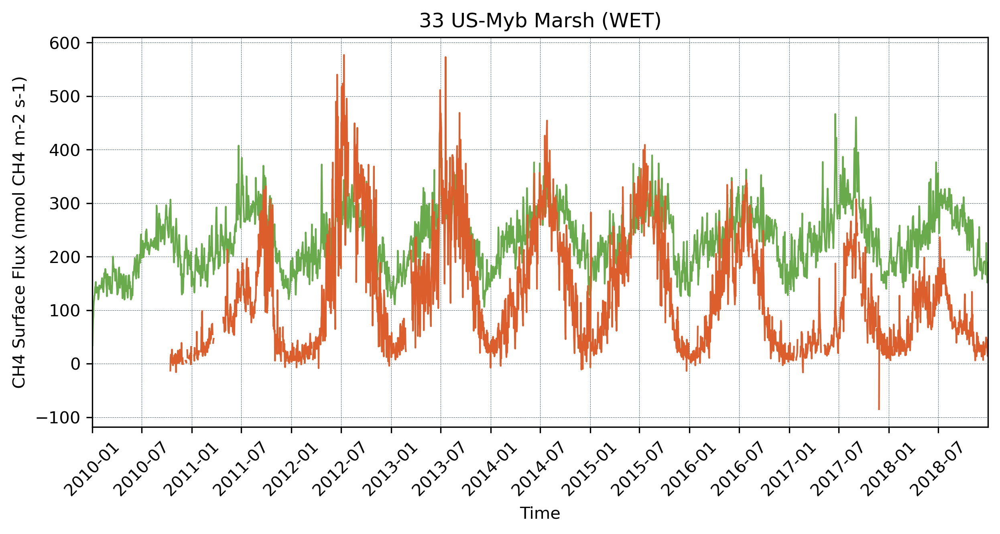

/tmp/ipykernel_559756/4101195460.py:104: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


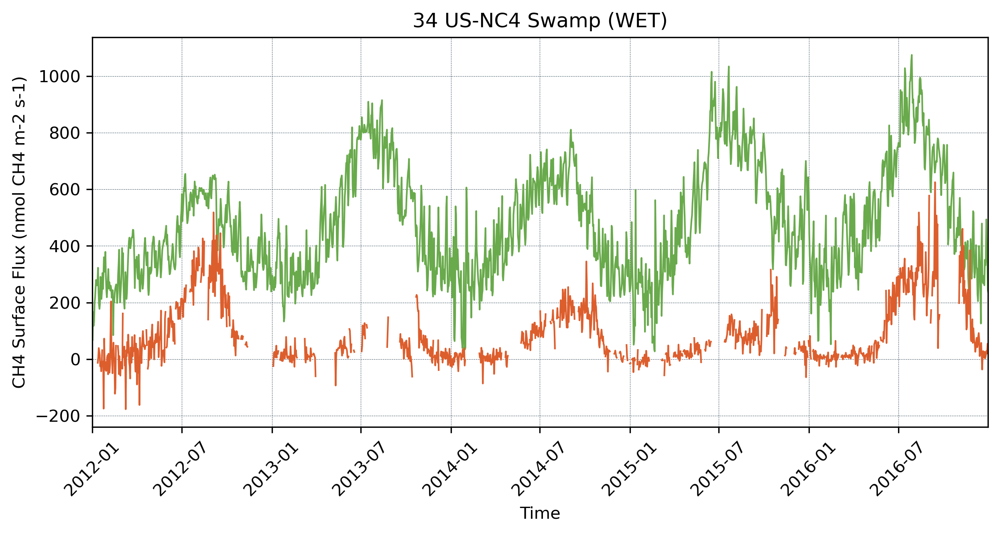

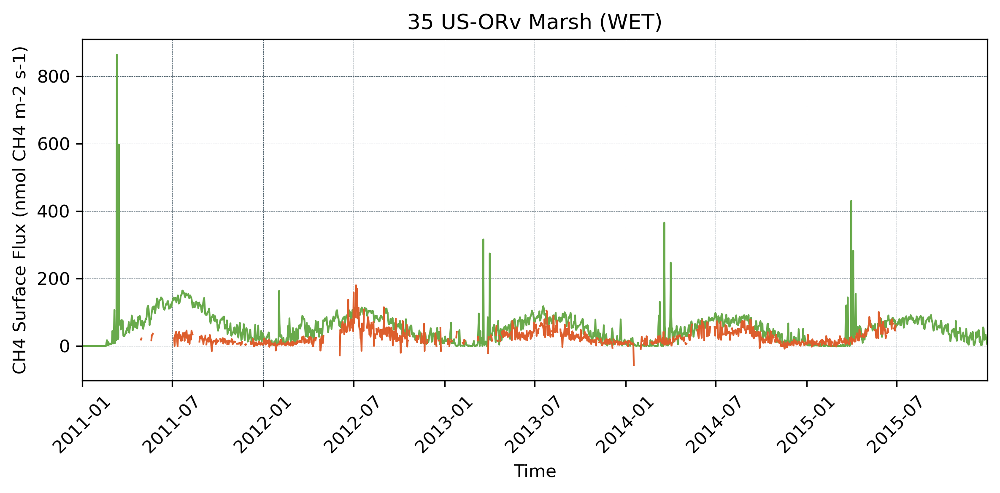

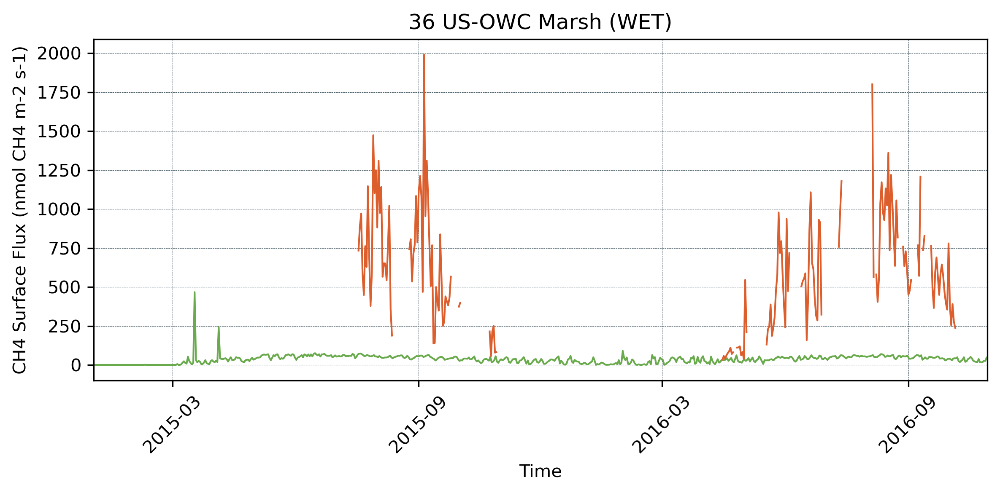

/tmp/ipykernel_559756/4101195460.py:104: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


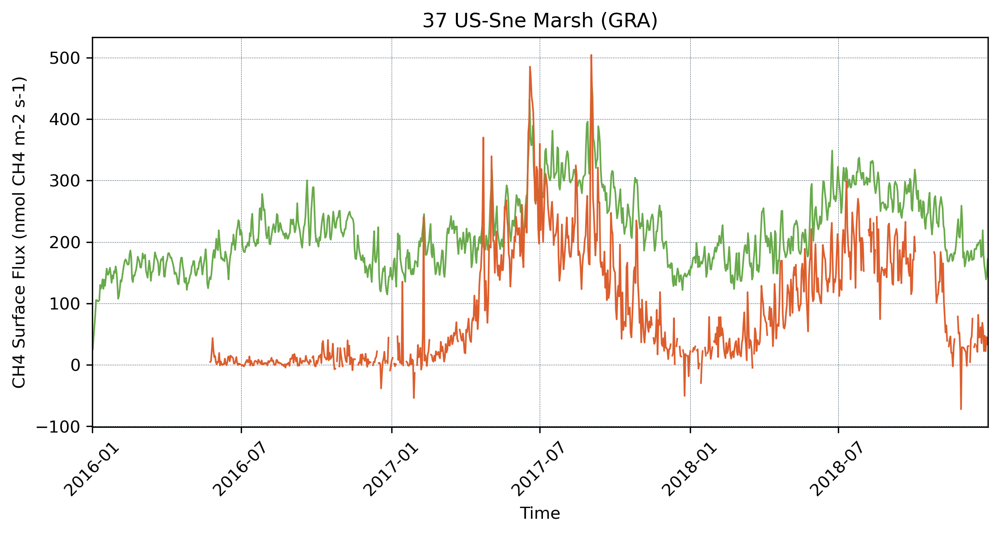

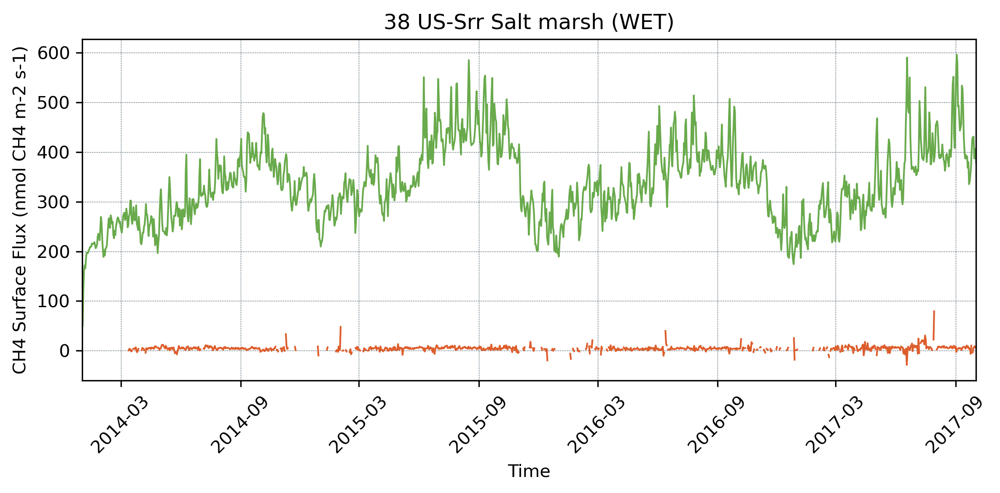

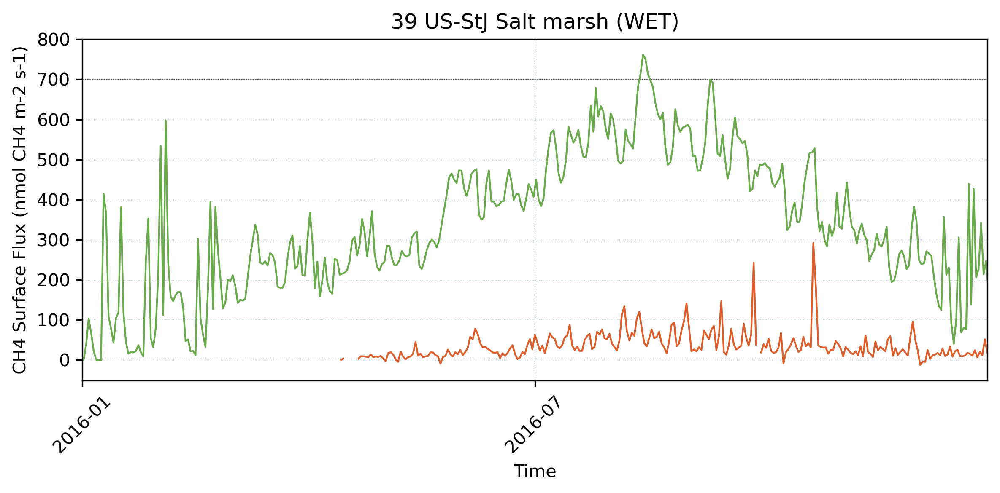

/tmp/ipykernel_559756/4101195460.py:104: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


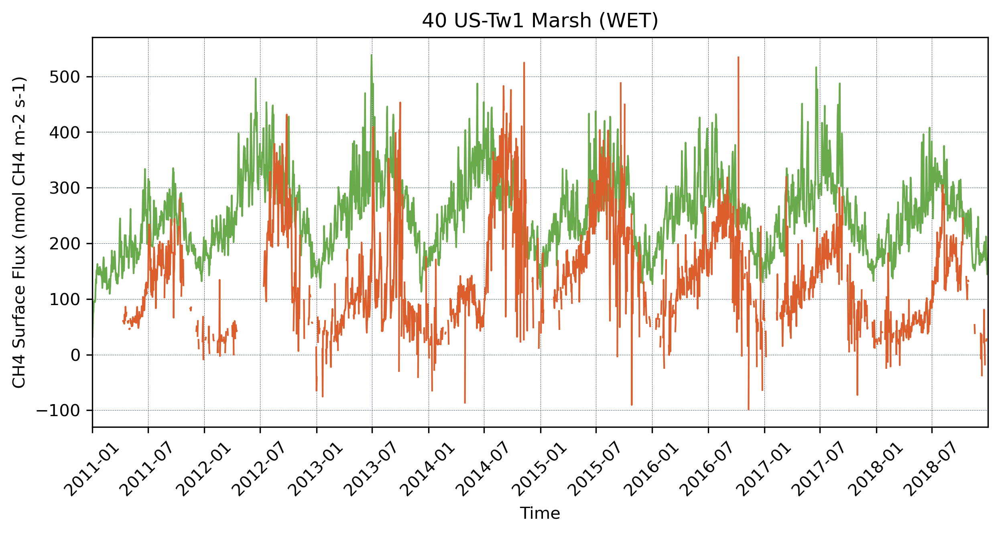

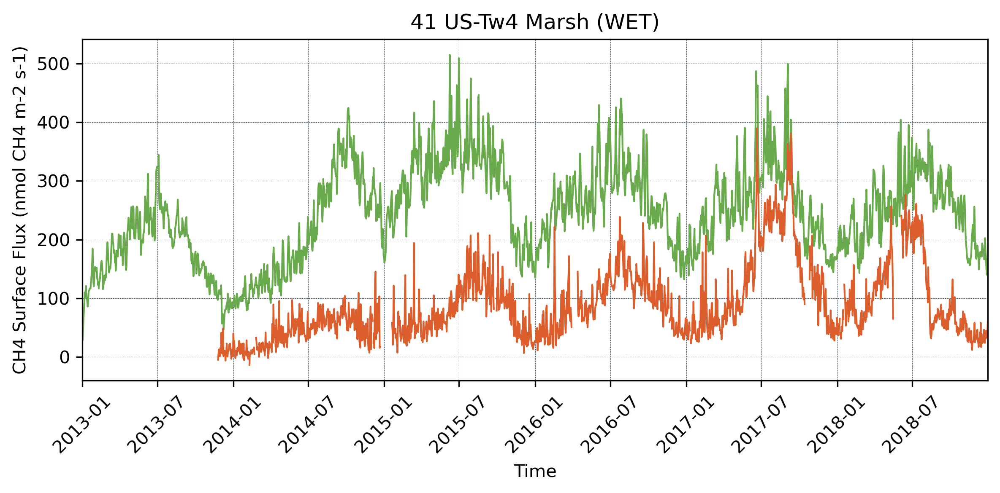

/tmp/ipykernel_559756/4101195460.py:104: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


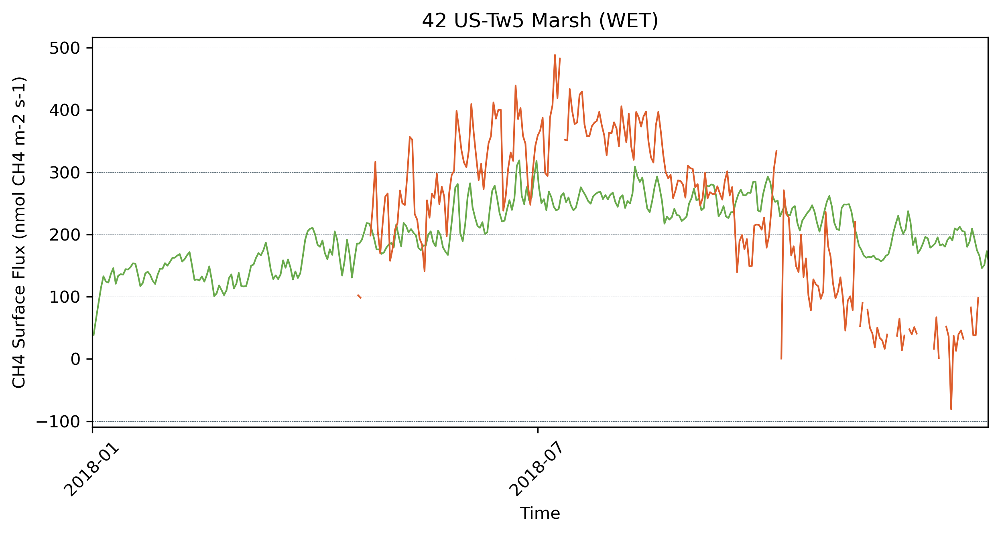

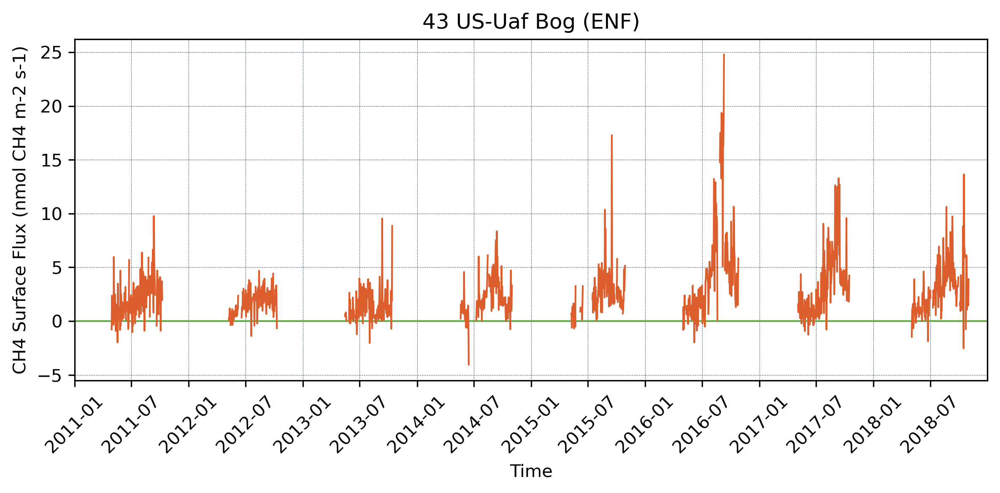

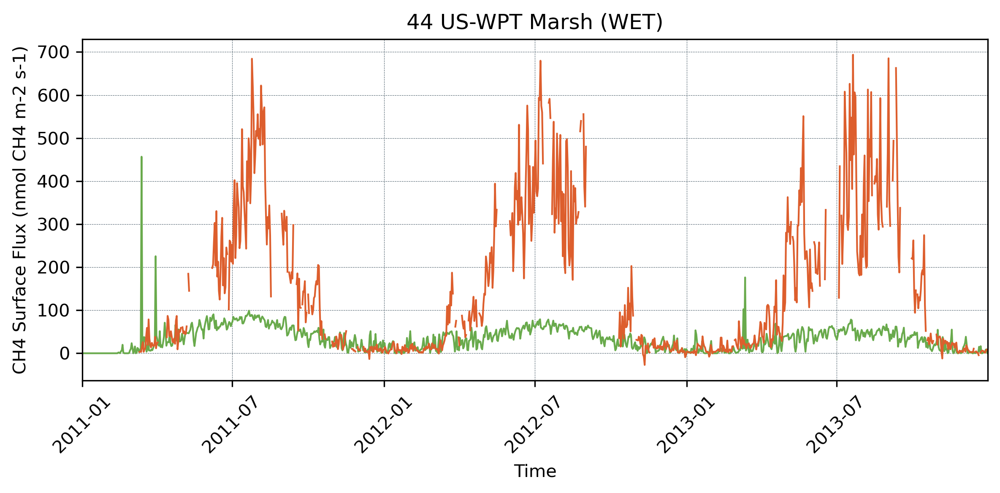

[]
[]
[]
[]


In [9]:
%matplotlib inline

import geopandas as gpd
from pylab import rcParams
import xarray as xr
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.ticker as ticker
import matplotlib.patches as patches
import matplotlib.font_manager as fm
from matplotlib.gridspec import GridSpec
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from matplotlib.dates import MonthLocator, DateFormatter
import numpy as np
import pandas as pd
import sys

# stnlist = f"/share/home/dq076/data/ME/FLUXNET-CH4/FLX_AA-Flx_CH4-META_20201112135337801132.csv"
stnlist = f"/share/home/dq076/data/ME/FLUXNET-CH4/FLX_AA-Flx_CH4-META_wetland.csv"
station_lists = pd.read_csv(stnlist, header=0)
# station_lists = station_lists[station_lists['FLUXNET-CH4_DATA_POLICY'] == 'CCBY4.0'].reset_index(drop=True)

# wetland_list = ['Fen','Swamp','Bog','Mangrove','Marsh','Salt marsh']
# mask = (station_lists['IGBP'] == 'WET') | (station_lists['SITE_CLASSIFICATION'].isin(wetland_list))
# station_lists = station_lists[mask].reset_index(drop=True)


case = 'frcsat0'
list1=[]
list2=[]
list3=[]
list4=[]

for i in range(station_lists.shape[0]):
    try:
        station_list = station_lists.iloc[i]
        siteid = station_list['SITE_ID']
        yrstt = station_list['YEAR_START']
        yrend = station_list['YEAR_END']
        igbptyp = station_list['IGBP']
        pfttyp = station_list['SITE_CLASSIFICATION']
        if pfttyp == 'Upland' or pfttyp == 'Drained' and isinstance(station_list['UPLAND_CLASS'], str):
            pfttyp = station_list['UPLAND_CLASS']

        if igbptyp == 'URB' or igbptyp=='SNO' or igbptyp=='WAT':
            list1.append(siteid)
            print(f"{siteid} 异常: 无PFT类型")
            continue

        var = 'ch4_surf_flux_tot'
        var1 = {'ch4_surf_flux_tot':'f_ch4_surf_flux_tot'}
        trans = {'ch4_surf_flux_tot':1/16e6}
        var2 = {'ch4_surf_flux_tot':'FCH4'}
        title = {'ch4_surf_flux_tot':'CH4 Surface Flux'}
        ytitle = title
        unit = {'ch4_surf_flux_tot':'nmol CH4 m-2 s-1'}
        path1 = f'/share/home/dq076/data/cases/site/{case}/{siteid}/postdata/'
        path2 = f'/share/home/dq076/data/ME/FLUXNET-CH4/FLX_{siteid}_FLUXNET-CH4_{yrstt}-{yrend}_1-1/'

        label = ['CoLM','FLUXNET-CH4']
        color = ["#69aa4c","#dd5e2d"]

        data1 = xr.open_dataset(f'{path1}{siteid}_hist_{yrstt}-{yrend}.nc')
        data2 = xr.open_dataset(f'{path2}{siteid}_FLUXNET-CH4_DD.nc')
        # print(data1)
        # print(data2)
        data1 = data1[var1[var]][:,0]*1e9
        data2 = data2[var2[var]][:,0,0]
        x = data2['time']

        # 检查 data1 是否全为 0 或 NaN
        data1_values = data1.values
        if np.all((np.isnan(data1_values) | (data1_values == 0))):
            list3.append(siteid)
            print(f"{siteid} 异常: data1 全为 0 或 NaN, 跳过绘制")
            continue

        # list4.append(siteid)
        # print(f"{siteid} 正常")
        # continue

        fig = plt.figure(figsize=(8, 4), dpi=300)
        fig.subplots_adjust(left=0.05, right=0.98, 
                        bottom=0.14, top=0.95, hspace=0.8) 
        gs = GridSpec(2, 48)
        ax = fig.add_subplot(gs[:, :])
        ax.grid(ls = "--", lw = 0.25, color = "#4E616C")
        ax.plot(data1['time'], data1, mfc = "white",lw = 1, ms = 2, color = color[0], label=label[0])
        ax.plot(data2['time'], data2, mfc = "white",lw = 1, ms = 2, color = color[1], label=label[1])
        # ax.set_title(f"{siteid} {mode}  {title[var]} ({unit[var]})")
        ax.set_title(f"{i+1} {siteid} {pfttyp} ({igbptyp})")

        ax.set_xlabel('Time')
        ax.set_ylabel(f"{ytitle[var]} ({unit[var]})")

        ax.xaxis.set_major_locator(MonthLocator(interval=6))
        ax.xaxis.set_major_formatter(DateFormatter('%Y-%m'))
        ax.set_xlim(x[0],x[-1])
        ax.tick_params(axis='x', rotation=45)

        plt.tight_layout()
        plt.show()
    except Exception as exc:
        station_list = station_lists.iloc[i]
        siteid = station_list['SITE_ID']
        list2.append(siteid)
        print(f"{siteid} 异常: 无模式结果")

print(list1)
print(list2)
print(list3)
print(list4)